# The North Face e-Commerce Project

Link to Google Collab notebook: https://colab.research.google.com/drive/1oBu2K04foP72i_LJI3PC_uJpbqM0CsVc?usp=sharing

##Project Context
The North Face marketing department would like to take advantage of machine learning solutions to boost online sales on the website : https://www.thenorthface.fr/

They have identified two major solutions that could have a huge effect on the conversion rates :

- Deploying a recommender system that will allow to suggest additionnal products to users, that are similar to the items they are already interested in. The recommendations could be materialized by a "you might also be interested by these products..." section that would appear on each product page of the website.
- Improving the structure of the products catalog thanks to topic extraction. The idea is to use unsupervised methods to challenge the existing categories : is it possible to find new categories of product that would be more suitable for the navigation on the website ?

##Goals 🎯
The project can be cut into three steps :

1) Identify groups of products that have similar descriptions.

2) Use the groups of similar products to build a simple recommender system algorithm.

3) Use topic modeling algorithms to automatically assess the latent topics present in the item descriptions.

### Imports

In [ ]:
import pandas as pd

In [ ]:
!pip install kagglehub[pandas-datasets]
import kagglehub
from kagglehub import KaggleDatasetAdapter

file_path = "sample-data.csv"

In [ ]:
# Load the dataset from Kagglehub
df = kagglehub.load_dataset(
  KaggleDatasetAdapter.PANDAS,
  "cclark/product-item-data",
  file_path
)

df.head()

/tmp/ipython-input-788985950.py:2: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


100%|██████████| 553k/553k [00:00<00:00, 3.64MB/s]


,id,description
0,1,Active classic boxers - There's a reason why o...
1,2,Active sport boxer briefs - Skinning up Glory ...
2,3,Active sport briefs - These superbreathable no...
3,4,"Alpine guide pants - Skin in, climb ice, switc..."
4,5,"Alpine wind jkt - On high ridges, steep ice an..."


In [ ]:
df.shape

(500, 2)

## **Text Preprocessing**

- Clean the corpus:
 - handle stop words
 - lemmatize the documents

- Encode the texts with TF-IDF transformation (sklearn TFIDFVectorizer)

In [ ]:
# Install spacy
!pip install spacy -q

# Import spacy
import spacy

# Download model
!python -m spacy download en_core_web_sm -q

# Import English using en_core_web_sm.load()
import en_core_web_sm
nlp = en_core_web_sm.load()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 119.7 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
# Check for missing data
df.isnull().sum()

,0
id,0
description,0


### 1. Data cleaning/Text normalization

In [ ]:
import string

## Normalize the text

# Convert to lowercase
df['clean_description'] = df['description'].str.lower()

# Remove punctuation
df['clean_description'] = df['clean_description'].str.translate(
    str.maketrans('','', string.punctuation))

# Removing leading and training whitespace
df['clean_description'] = df['clean_description'].str.strip()

# Replace multiple spaces with a single space
df['clean_description'] = df['clean_description'].str.replace(
    r'\s+', ' ', regex=True)


In [ ]:
df

,id,description,clean_description
0,1,Active classic boxers - There's a reason why o...,active classic boxers theres a reason why our ...
1,2,Active sport boxer briefs - Skinning up Glory ...,active sport boxer briefs skinning up glory re...
2,3,Active sport briefs - These superbreathable no...,active sport briefs these superbreathable nofl...
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpine guide pants skin in climb ice switch to...
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpine wind jkt on high ridges steep ice and a...
...,...,...,...
495,496,Cap 2 bottoms - Cut loose from the maddening c...,cap 2 bottoms cut loose from the maddening cro...
496,497,Cap 2 crew - This crew takes the edge off fick...,cap 2 crew this crew takes the edge off fickle...
497,498,All-time shell - No need to use that morning T...,alltime shell no need to use that morning time...
498,499,All-wear cargo shorts - All-Wear Cargo Shorts ...,allwear cargo shorts allwear cargo shorts bask...


### 2. Tokenization & Linguistic Processing

In [ ]:
# Import stop words from spacy
from spacy.lang.en.stop_words import STOP_WORDS

# Tokenize the cleaned document
tokenized_doc = df['clean_description'].fillna('').apply(lambda x: nlp(x))

# Lemmatize and remove stop-words
tokenized_doc = tokenized_doc.apply(lambda x: [token.lemma_ for token in x if token.text not in STOP_WORDS])
tokenized_doc


,clean_description
0,"[active, classic, boxer, s, reason, boxer, cul..."
1,"[active, sport, boxer, brief, skin, glory, req..."
2,"[active, sport, brief, superbreathable, nofly,..."
3,"[alpine, guide, pant, skin, climb, ice, switch..."
4,"[alpine, wind, jkt, high, ridge, steep, ice, a..."
...,...
495,"[cap, 2, bottom, cut, loose, madden, crowd, se..."
496,"[cap, 2, crew, crew, take, edge, fickle, weath..."
497,"[alltime, shell, need, use, morning, time, umb..."
498,"[allwear, cargo, short, allwear, cargo, short,..."


In [ ]:
# add a clean token column (no stop words)
df["clean_token"] = [" ".join(x) for x in tokenized_doc]
df.head()

,id,description,clean_description,clean_token
0,1,Active classic boxers - There's a reason why o...,active classic boxers theres a reason why our ...,active classic boxer s reason boxer cult favor...
1,2,Active sport boxer briefs - Skinning up Glory ...,active sport boxer briefs skinning up glory re...,active sport boxer brief skin glory require mo...
2,3,Active sport briefs - These superbreathable no...,active sport briefs these superbreathable nofl...,active sport brief superbreathable nofly brief...
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpine guide pants skin in climb ice switch to...,alpine guide pant skin climb ice switch rock t...
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpine wind jkt on high ridges steep ice and a...,alpine wind jkt high ridge steep ice alpine ja...


### TF-IDF (Term Frequency–Inverse Document Frequency)

TF-IDF is a measure of importance of a word to a document in a collection or corpus, adjusted for the fact that some words appear more frequently in general.

In [ ]:
# TF-IDF transformer
from sklearn.feature_extraction.text import TfidfVectorizer

# TF-IDF vector
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(df['clean_token'])

# Transform X to an array
dense = X.toarray()
dense

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
# Creating a DataFrame with all the words and tf-idf score
tfid_df = pd.DataFrame(dense,
                        columns=[x for x in vectorizer.get_feature_names_out()])

tfid_df

,06,07,08,09,10,100,100gram,101,102,103,...,zipperli,zippersli,zippersliulbrbrbfabric,zippingli,zippocket,zips,zipsecurity,zipthrough,zone,zonesli
0,0.0,0.0,0.0,0.0,0.0,0.073041,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.104169,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.048990,0.0,0.0,0.0,0.0,...,0.071481,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.0,0.0,0.0,0.0,0.0,0.033364,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
496,0.0,0.0,0.0,0.0,0.0,0.066476,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
497,0.0,0.0,0.0,0.0,0.0,0.135668,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
498,0.0,0.0,0.0,0.0,0.0,0.072294,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Transpose dataframe and check top 15 words with the highest average TF-IDF scores across all product descriptions
tf_idf = tfid_df.T
tf_idf.mean(axis=1).sort_values(ascending=False)[:15]

,0
organic,0.047746
recycle,0.047413
recyclable,0.043195
common,0.042641
thread,0.042562
pocket,0.042540
cotton,0.041076
polyester,0.037569
100,0.036239
oz,0.031209


**Key insights:**

- Sustainability (organic, recycle) is a prominent theme across many product descriptions.
- Materials are consistently important across products (cotton, polyester, fabric, thread)
- Functional design and features are key product highlights (pocket, shoulder, dwr)

## **Part 1. Groups of products with similar descriptions**


In [ ]:
# import DBSCAN from sklearn and numpy
from sklearn.cluster import DBSCAN
import numpy as np

# Instanciate DBSCAN
db = DBSCAN(eps=0.78, min_samples=3, metric="cosine", algorithm="auto")

# Fit on data
db.fit(X)

DBSCAN(eps=0.78, metric='cosine', min_samples=3)

In [ ]:
db.labels_

array([ 0,  0,  0,  0,  0,  0,  1,  2,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  3,  4,  4,  0,
        0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        3,  0,  0,  0,  0,  0,  5,  0,  5, -1,  6,  6,  6,  0,  1,  1,  0,
        0,  6,  6,  6,  6,  0,  0,  1,  1,  0,  0,  0,  0,  7,  0,  0,  0,
        0,  1,  0,  0,  0,  0,  0,  0, -1, -1,  8,  8,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  0,  1,  4,  0,  8,
        7,  0,  0, -1,  0,  7,  0,  0, -1,  0,  0,  6,  0,  0,  0,  0,  0,
        0,  9, 12,  0, -1,  0,  0,  0,  0,  0,  0, 10,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 11, 11,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  5,  0,  0,  0,  0,  6,  6,  6,  6,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  2,  2,  2,
        2,  0,  0,  0,  5

In [ ]:
cluster_labels = db.labels_
coords = X.toarray()

nb_clusters = len(np.unique(cluster_labels) )
nb_noise = np.sum(np.array(cluster_labels) == -1, axis=0)

print('Estimated nb. of clusters: %d' % nb_clusters)
print('Estimated nb. of noise points: %d' % nb_noise)

Estimated nb. of clusters: 14
Estimated nb. of noise points: 11


In [ ]:
df["cluster"] = db.labels_
df.head()

,id,description,clean_description,clean_token,cluster
0,1,Active classic boxers - There's a reason why o...,active classic boxers theres a reason why our ...,active classic boxer s reason boxer cult favor...,0
1,2,Active sport boxer briefs - Skinning up Glory ...,active sport boxer briefs skinning up glory re...,active sport boxer brief skin glory require mo...,0
2,3,Active sport briefs - These superbreathable no...,active sport briefs these superbreathable nofl...,active sport brief superbreathable nofly brief...,0
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpine guide pants skin in climb ice switch to...,alpine guide pant skin climb ice switch rock t...,0
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpine wind jkt on high ridges steep ice and a...,alpine wind jkt high ridge steep ice alpine ja...,0


In [ ]:
df.to_csv('Northface_clusters_test.csv')

- Word cloud per cluster

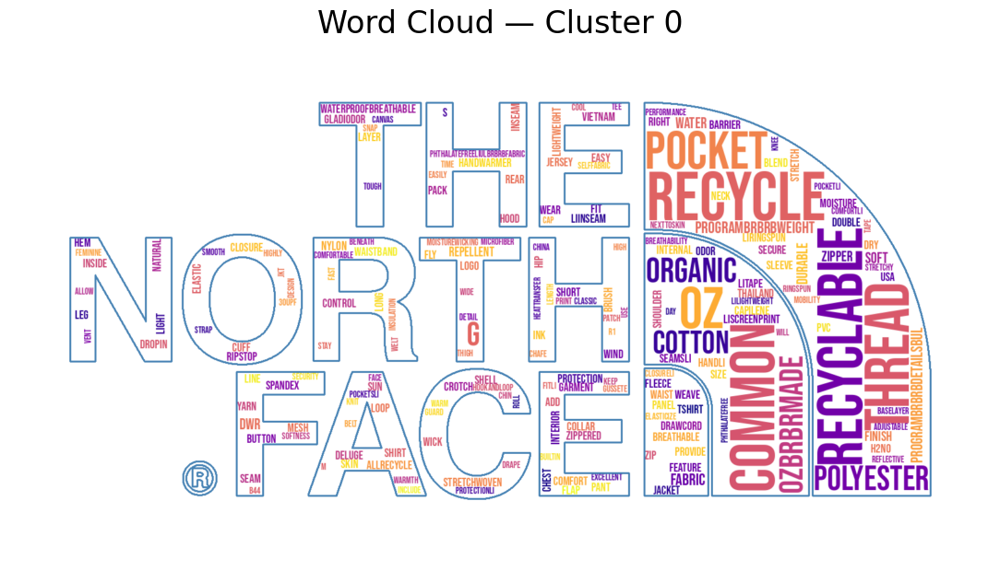

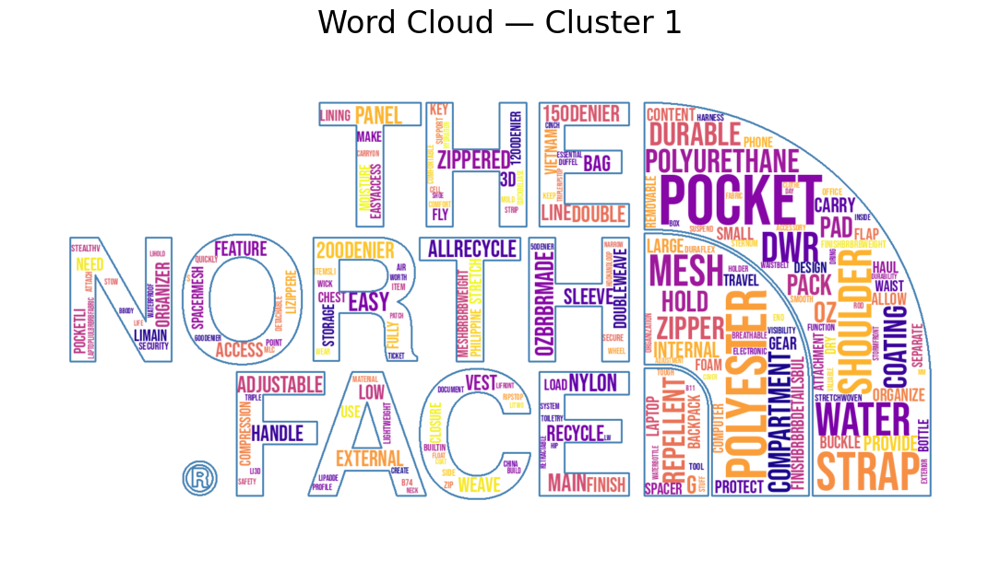

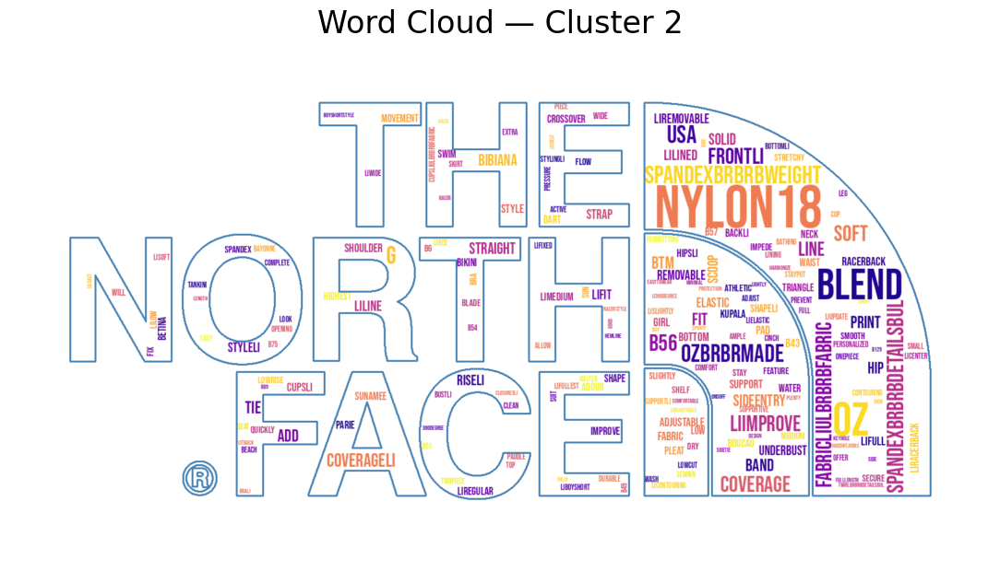

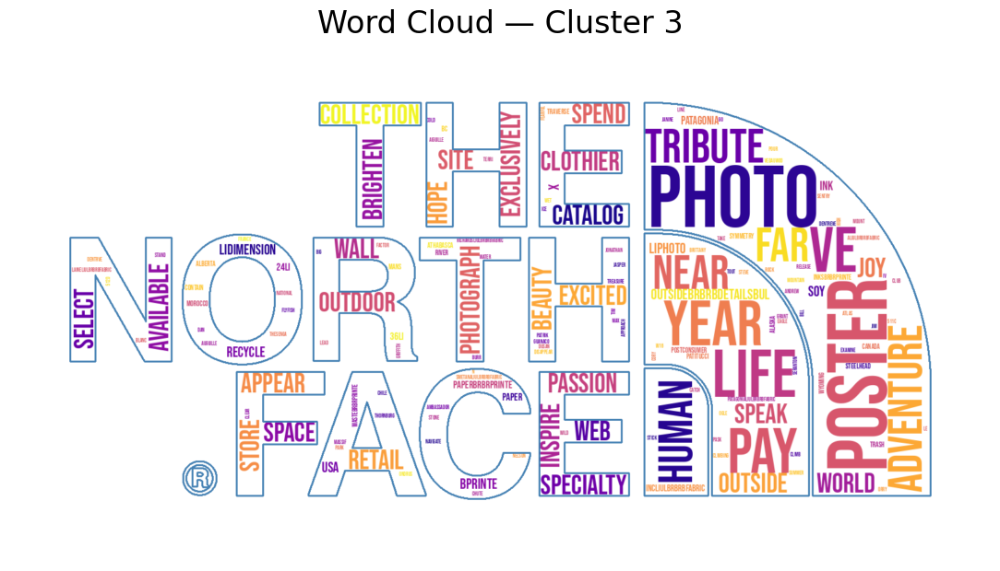

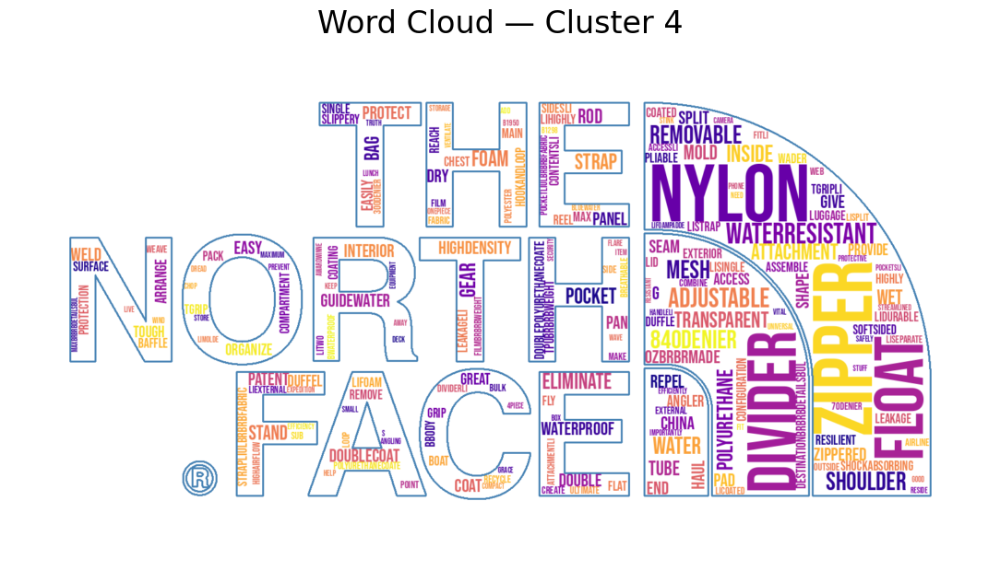

...

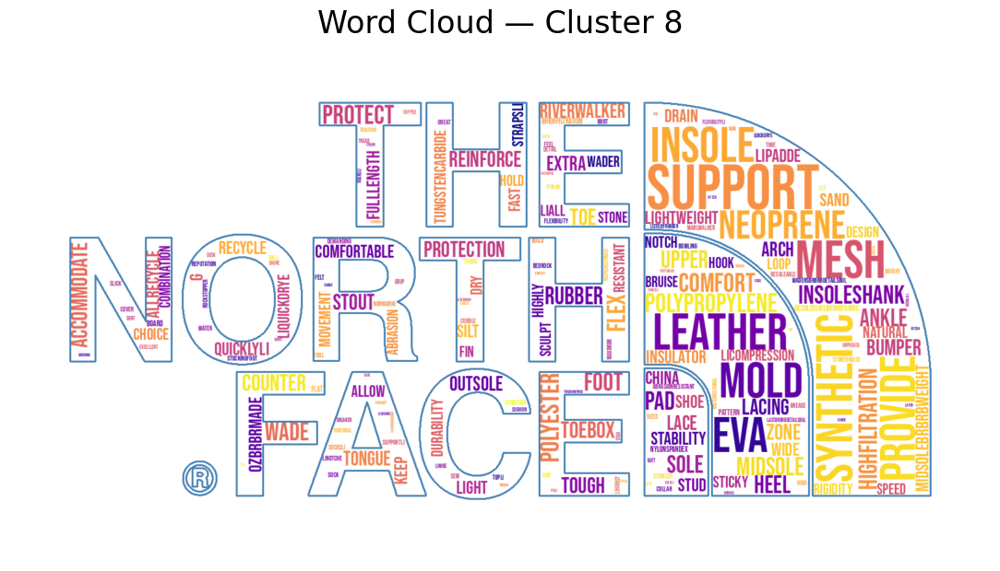

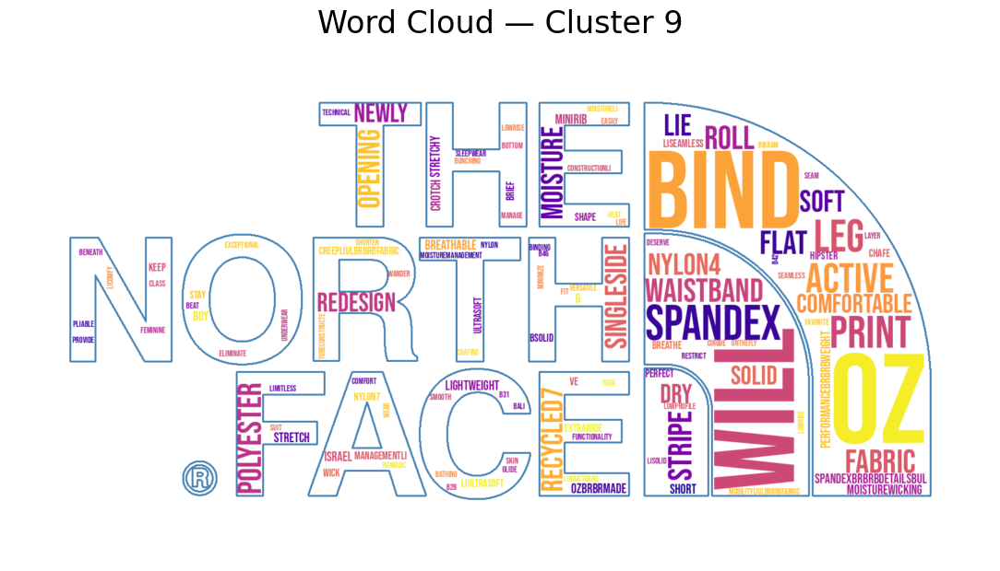

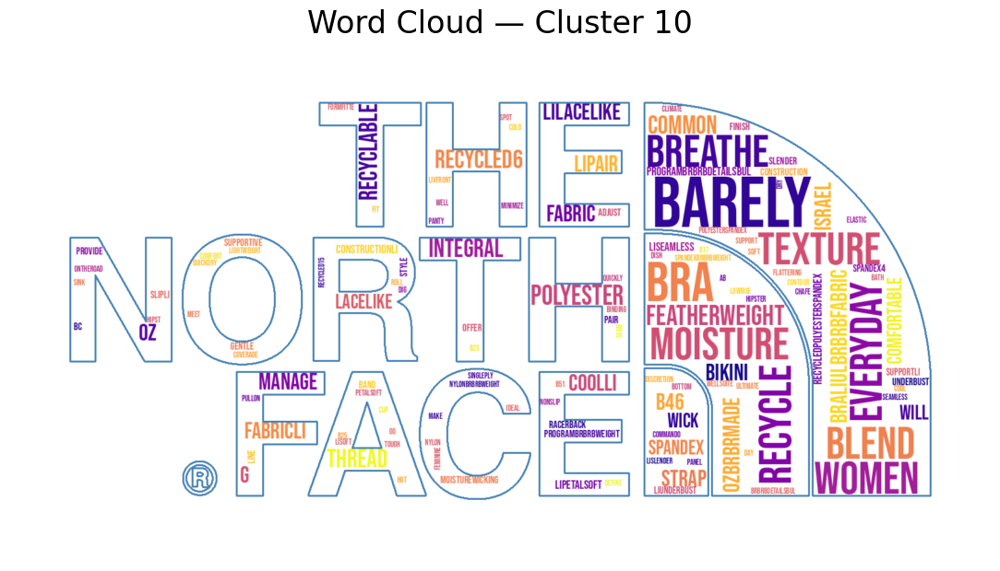

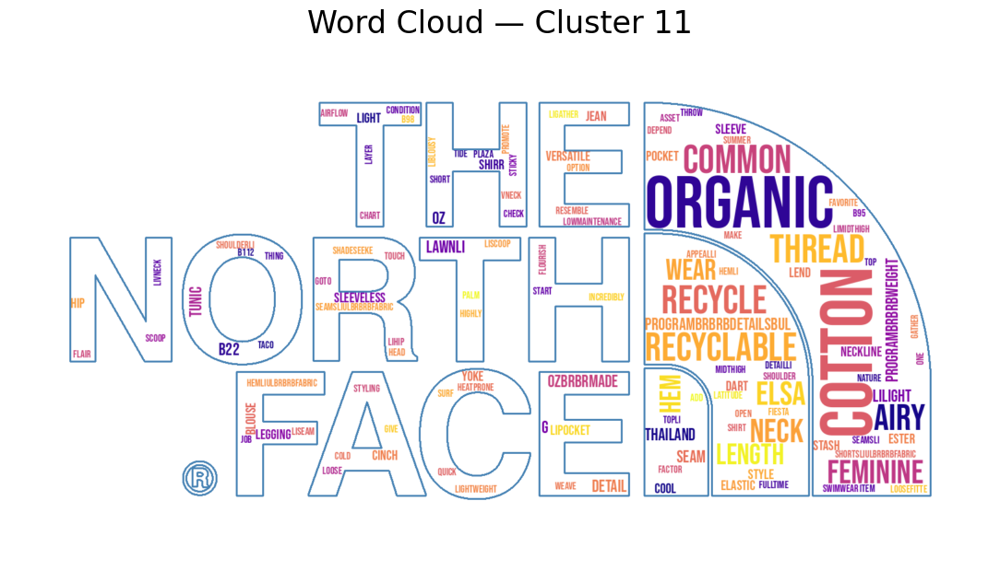

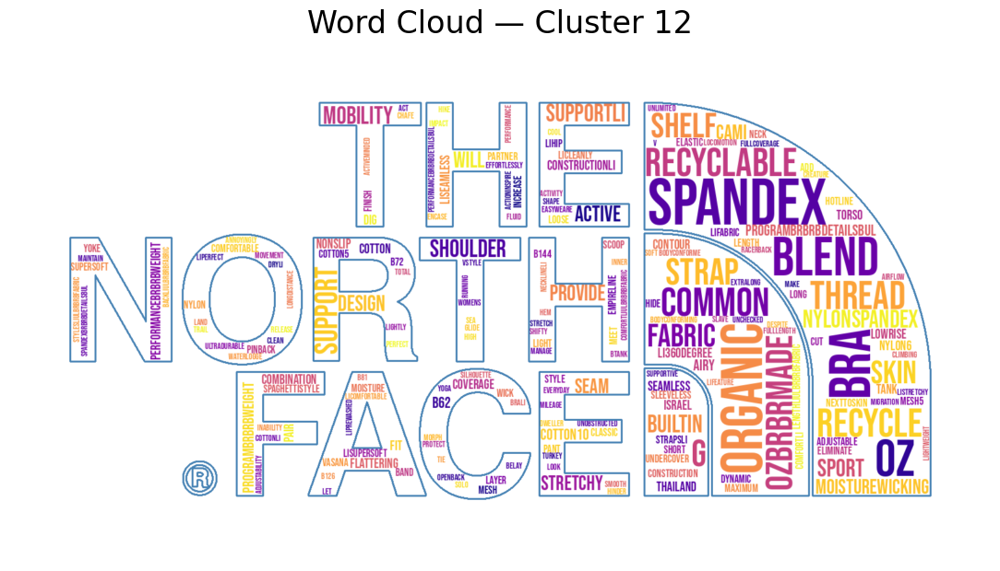

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import numpy as np
from PIL import Image

# Load the image and convert it to a mask
logo_image = Image.open("northfacelogo.png").convert("RGBA")

# Convert fully transparent pixels to white
rgba = np.array(logo_image)
rgba[rgba[:, :, 3] == 0] = [255, 255, 255, 255]  # RGBA white
logo_image = Image.fromarray(rgba).convert("L")

mask = np.array(logo_image)

# Set a custom font (Google Fonts etc.)
font_path = "BebasNeue-Regular.ttf"

# Configure word cloud
wc = WordCloud(
    width=800,
    height=400,
    background_color="white",
    max_words=200,
    mask=mask,
    contour_color='steelblue',
    contour_width=2,
    colormap='plasma',
    font_path=font_path,
    random_state=42,
    collocations=False,
    prefer_horizontal=0.9,  # mostly horizontal words
    normalize_plurals=True
)

# Generate and plot one cloud per cluster
for i in range(nb_clusters - 1):
    df_cluster = df[df["cluster"] == i]
    text = " ".join(df_cluster['clean_token'])

    cloud = wc.generate(text)

    plt.figure(figsize=(12, 6))
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Word Cloud — Cluster {i}", fontsize=24)
    plt.tight_layout(pad=0)
    plt.show()


## **Part 2 - Recommendation system**

In [ ]:
# Define the function
def find_similar_items(item_id):
  """
  Suggests to users a list of items that are similar to the ones they are interested in (based on clusters)

  Args:
    item_id (int): Initial item ID of the article that they are interested in (to be inputted by the user)

  Returns:
    list: At most 5 item id's of articles that are similar, i.e., that belong to the same cluster as the original item of interest.
    NB. Since some clusters have less than 5 articles belonging to them, not all the lists will contain 5 articles, some may repeat the same article(s)

  """

    # Error checking
  if not isinstance(item_id, (float, int)):
    raise ValueError('Item id must be a numeric value')

  if item_id <= 0:
    raise ValueError('Item id cannot be negative or equal to 0')

  if item_id > 500:
    raise ValueError('Item id cannot be greater than 500 - there are only 500 articles.')

  df_cluster = df.loc[df["id"] == item_id, "cluster"]

  if df_cluster.empty:
      return []

  cluster_id = df_cluster.iloc[0]

  similar_ids = df.loc[df["cluster"] == cluster_id, "id"]

  return similar_ids.sample(n=5, replace=len(similar_ids) < 5).tolist()


In [ ]:
# Request input from users with error handling
while True:
    try:
        item_id = int(input("Please enter one item ID (Note: items are listed from 1-500): "))
        similar_items = find_similar_items(item_id)
        print(f"Here are IDs of similar items: {similar_items}")
        break  # Exit loop if input is valid
    except ValueError as e:
        print(f"Invalid input: {e}. Please try again.")

Please enter one item ID (Note: items are listed from 1-500): 40
Here are IDs of similar items: [411, 76, 184, 341, 358]


## **Part 3a: Topic modeling with LSA**

- The aim is to use an LSA model to automatically extract latent topics in the products' descriptions.

1. Use TruncatedSVD to make some topic extraction from the TF-IDF matrix.

2. Display wordclouds to analyze the results.

#### **Topic extraction**

In [ ]:
from sklearn.decomposition import TruncatedSVD

# 1. Make sure each row is a string (tokens joined)
texts = df["clean_token"].astype(str)

# 2. TF-IDF on the whole corpus
vectorizer = TfidfVectorizer(stop_words="english", max_features=1000)
X = vectorizer.fit_transform(texts)

# 3. LSA / Truncated SVD
svd_model = TruncatedSVD(n_components=15, n_iter=100, random_state=42)
lsa = svd_model.fit_transform(X)

# 4. Topic-encoded DataFrame
topic_encoded_df = pd.DataFrame(
    lsa,
    columns=[f"topic_{i+1}" for i in range(15)],
    index=df.index
)
topic_encoded_df["document"] = texts

topic_encoded_df.head()


,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,topic_10,topic_11,topic_12,topic_13,topic_14,topic_15,document
0,0.258929,-0.103211,0.160485,0.138333,-0.090133,-0.042104,-0.098972,-0.061457,0.079038,-0.091016,-0.008716,0.027550,-0.042778,-0.033637,0.041614,active classic boxer s reason boxer cult favor...
1,0.227127,-0.117365,0.090601,0.108067,0.004629,-0.033614,-0.061530,-0.045153,-0.025832,-0.066045,0.114370,0.163024,0.100055,-0.039124,0.067135,active sport boxer brief skin glory require mo...
2,0.218342,-0.118439,0.109009,0.067354,0.008553,-0.068134,-0.014446,0.041716,-0.044143,-0.035543,0.103106,0.180339,0.154819,-0.051954,0.048608,active sport brief superbreathable nofly brief...
3,0.309033,-0.296012,-0.072062,-0.126353,0.000905,0.041703,-0.001448,-0.118272,0.009442,-0.048578,0.122355,0.025210,-0.124258,-0.023135,-0.020759,alpine guide pant skin climb ice switch rock t...
4,0.330700,-0.330005,0.054039,-0.211225,-0.070266,-0.014255,0.106953,-0.057167,-0.013853,0.010032,0.122676,0.023530,-0.180135,-0.243434,-0.030750,alpine wind jkt high ridge steep ice alpine ja...


In [ ]:
# Extract topic columns
topic_columns = [col for col in topic_encoded_df.columns if col.startswith("topic_")]

# Find the main topic for each document
topic_encoded_df["main_topic"] = topic_encoded_df[topic_columns].idxmax(axis=1)  # Get the column name of the highest coefficient

In [ ]:
topic_encoded_df.head()

,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,topic_10,topic_11,topic_12,topic_13,topic_14,topic_15,document,main_topic
0,0.258929,-0.103211,0.160485,0.138333,-0.090133,-0.042104,-0.098972,-0.061457,0.079038,-0.091016,-0.008716,0.027550,-0.042778,-0.033637,0.041614,active classic boxer s reason boxer cult favor...,topic_1
1,0.227127,-0.117365,0.090601,0.108067,0.004629,-0.033614,-0.061530,-0.045153,-0.025832,-0.066045,0.114370,0.163024,0.100055,-0.039124,0.067135,active sport boxer brief skin glory require mo...,topic_1
2,0.218342,-0.118439,0.109009,0.067354,0.008553,-0.068134,-0.014446,0.041716,-0.044143,-0.035543,0.103106,0.180339,0.154819,-0.051954,0.048608,active sport brief superbreathable nofly brief...,topic_1
3,0.309033,-0.296012,-0.072062,-0.126353,0.000905,0.041703,-0.001448,-0.118272,0.009442,-0.048578,0.122355,0.025210,-0.124258,-0.023135,-0.020759,alpine guide pant skin climb ice switch rock t...,topic_1
4,0.330700,-0.330005,0.054039,-0.211225,-0.070266,-0.014255,0.106953,-0.057167,-0.013853,0.010032,0.122676,0.023530,-0.180135,-0.243434,-0.030750,alpine wind jkt high ridge steep ice alpine ja...,topic_1


In [ ]:
topic_encoded_df.to_csv('Northface_topics_test.csv')

In [ ]:
# The most prominent topics (across documents)
topic_encoded_df["main_topic"].value_counts()

,count
main_topic,
topic_1,319
topic_3,42
topic_8,30
topic_5,24
topic_10,20
topic_12,17
topic_13,15
topic_15,8
topic_9,8


#### **Word cloud per main topic**

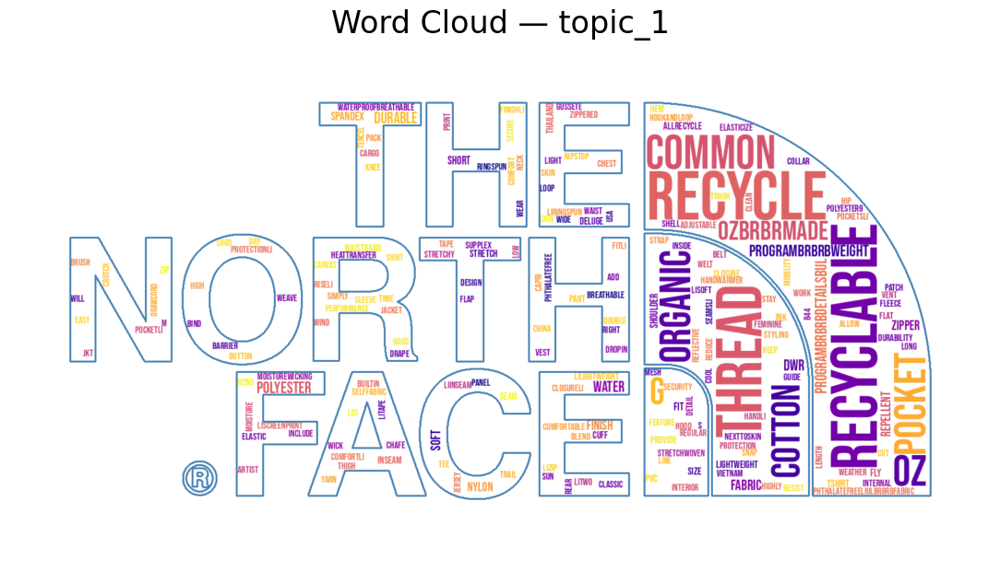

Skipping topic_2, no documents found.


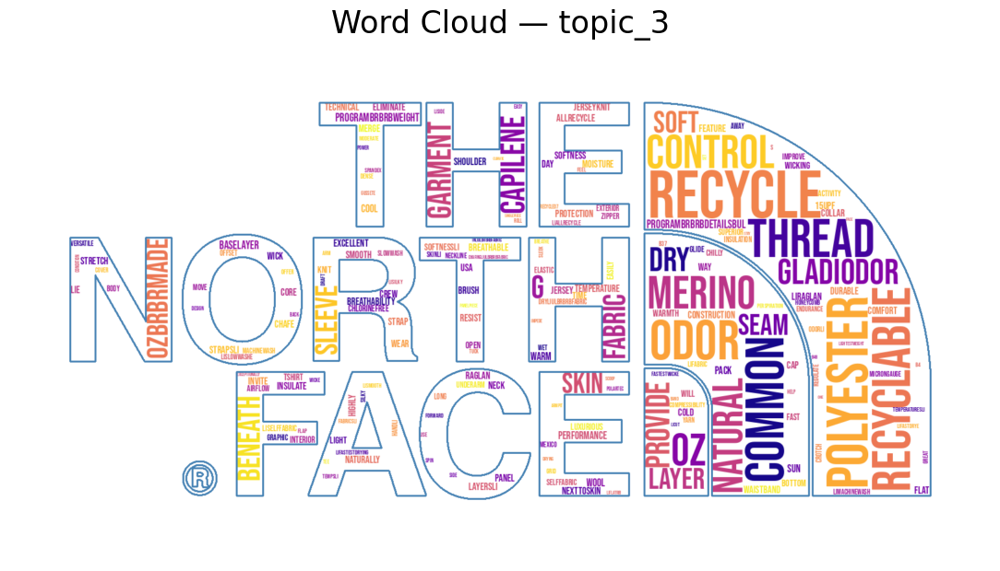

Skipping topic_4, no documents found.


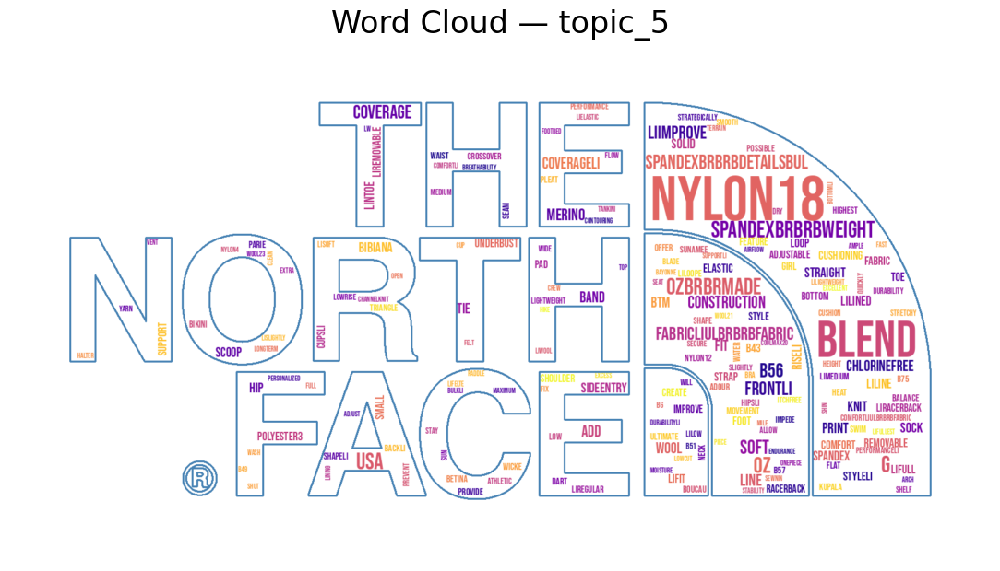

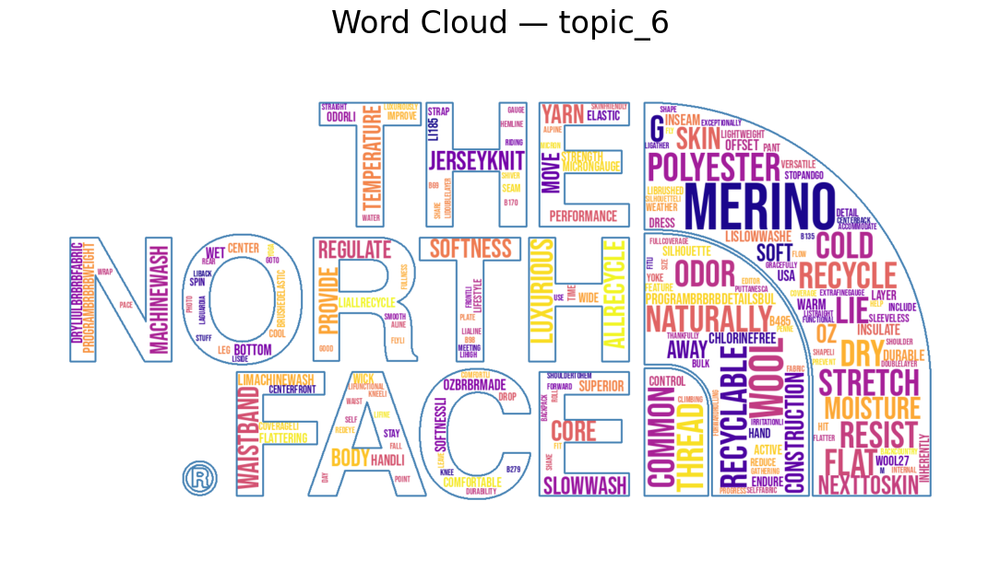

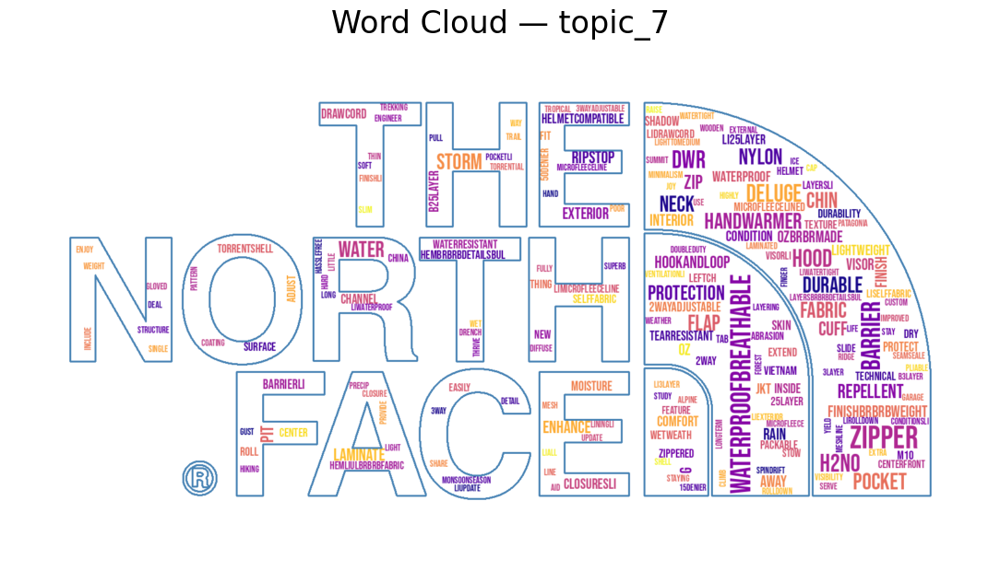

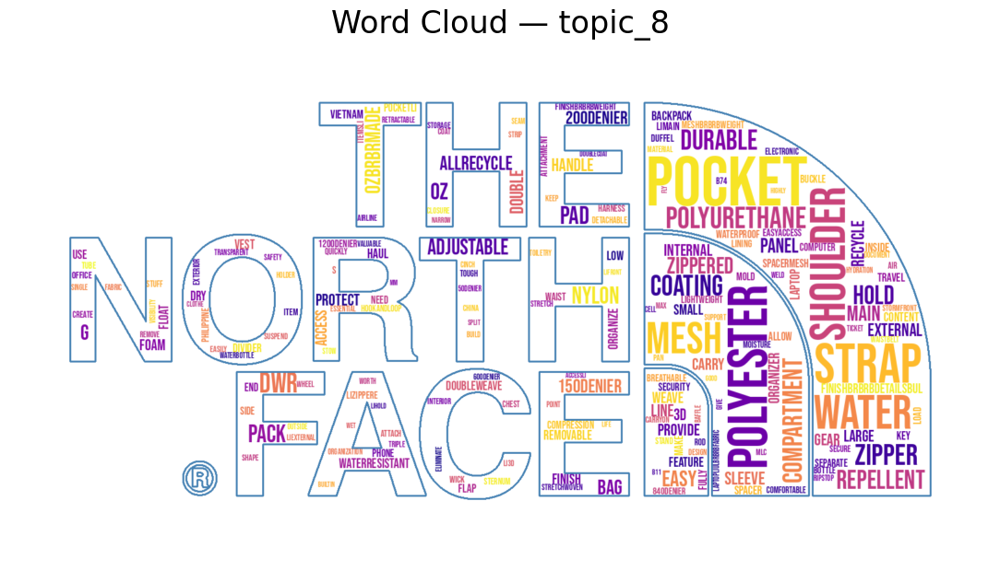

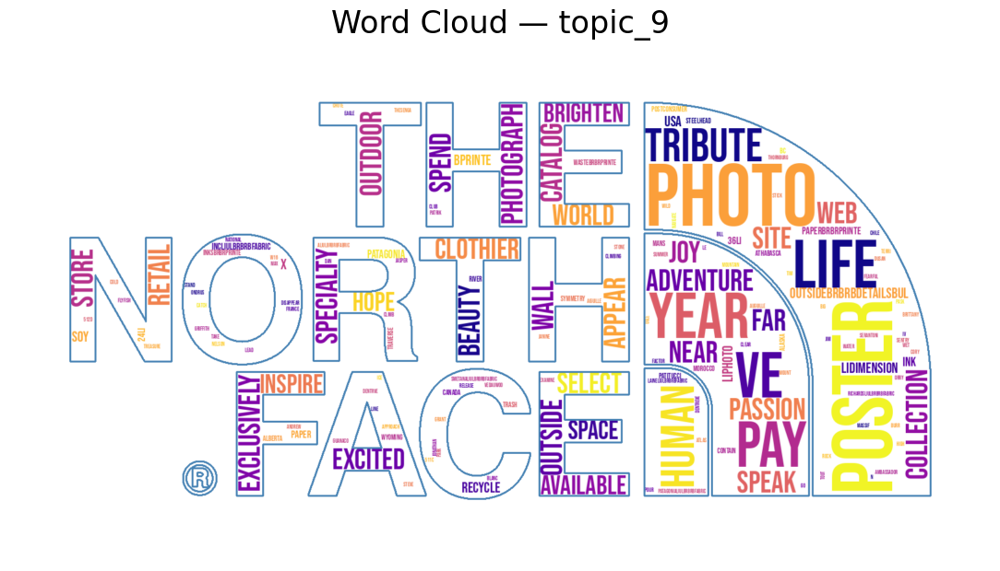

...

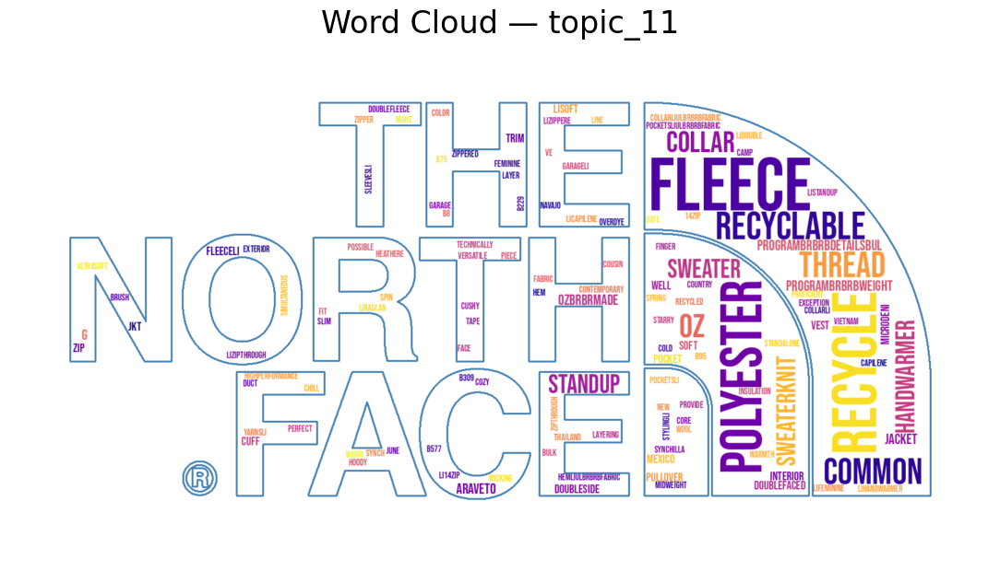

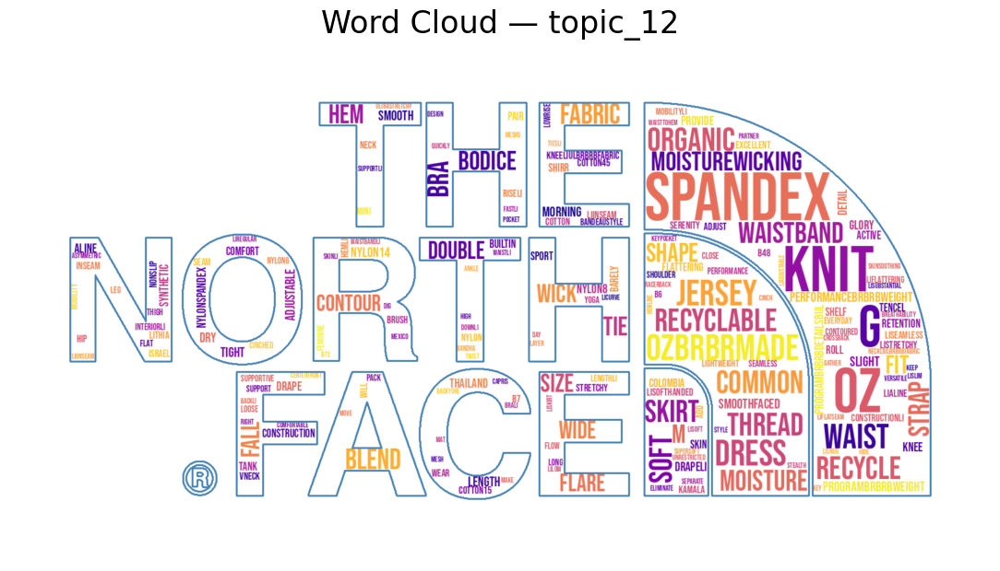

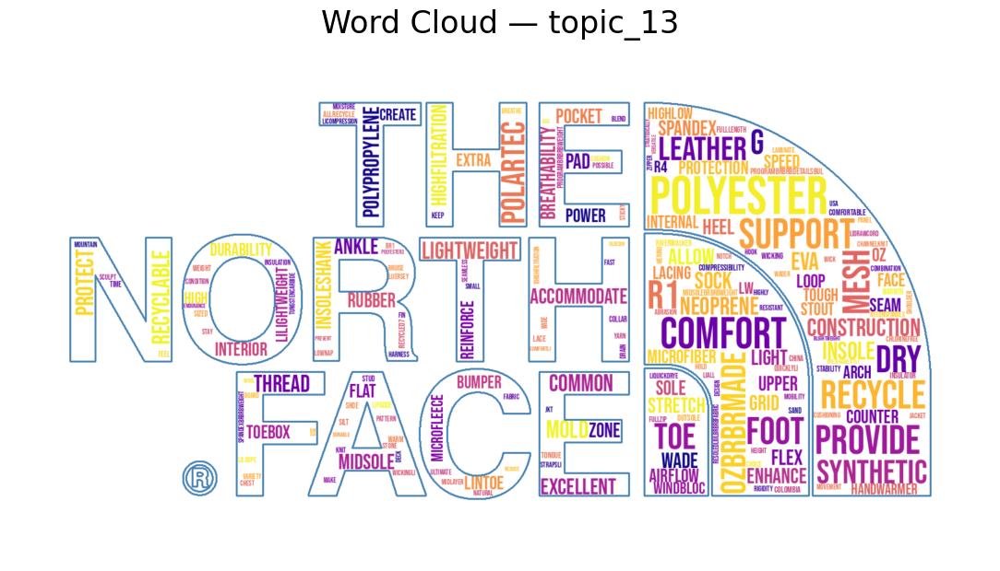

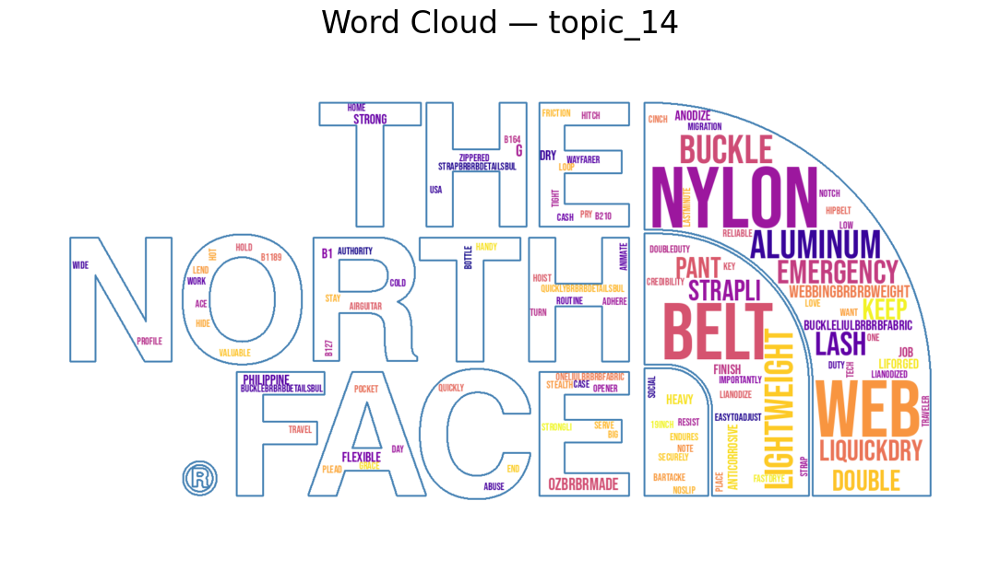

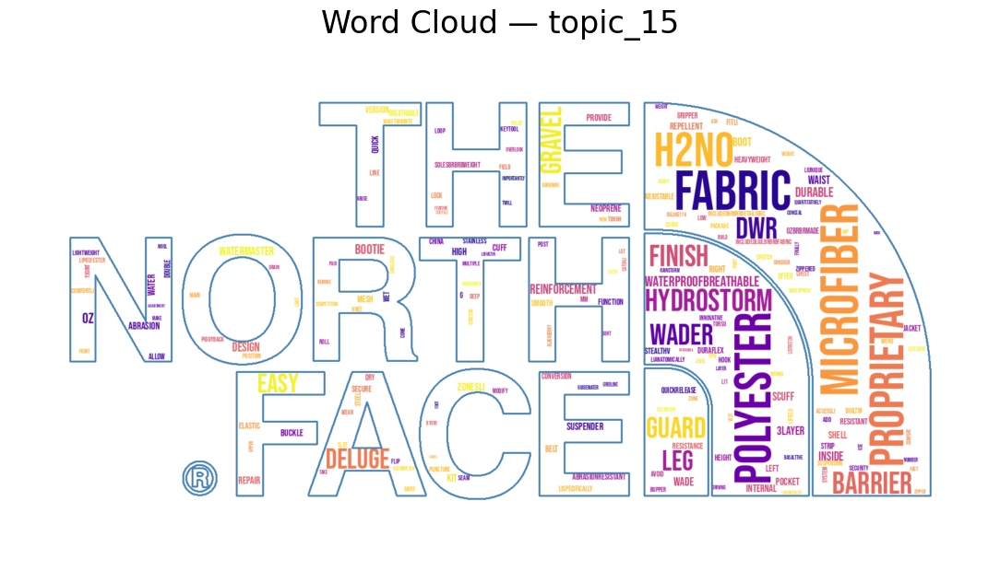

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import numpy as np
from PIL import Image

# === Load and clean the North Face logo mask ===
logo_image = Image.open("northfacelogo.png").convert("RGBA")

# Convert fully transparent pixels to white
rgba = np.array(logo_image)
rgba[rgba[:, :, 3] == 0] = [255, 255, 255, 255]
logo_image = Image.fromarray(rgba).convert("L")
mask = np.array(logo_image)

# === Custom font ===
font_path = "BebasNeue-Regular.ttf"

# === WordCloud config (same style as before) ===
wc = WordCloud(
    width=600,
    height=300,
    background_color="white",
    max_words=200,
    mask=mask,
    contour_color='steelblue',
    contour_width=2,
    colormap='plasma',
    font_path=font_path,
    random_state=42,
    collocations=False,
    prefer_horizontal=0.9,
    normalize_plurals=True
)

# === Generate one cloud per topic ===
topic_columns = [f"topic_{i}" for i in range(1, 16)]

for i in range(1, len(topic_columns) + 1):
    topic_name = f"topic_{i}"
    df_topic = topic_encoded_df[topic_encoded_df["main_topic"] == topic_name]

    if df_topic.empty:
        print(f"Skipping {topic_name}, no documents found.")
        continue

    text = " ".join(df_topic["document"])

    cloud = wc.generate(text)

    plt.figure(figsize=(12, 6))
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Word Cloud — {topic_name}", fontsize=24)
    plt.tight_layout(pad=0)
    plt.show()


## **Part 3b: Topic modeling with BERTopic**

A topic modeling technique that leverages transformers and c-TF-IDF to create dense clusters allowing for easily interpretable topics whilst keeping important words in the topic descriptions.

In [ ]:
!pip install bertopic
from bertopic import BERTopic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.0/153.0 kB 4.1 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/hdbscan/plots.py:448: SyntaxWarning:

invalid escape sequence '\l'

/usr/local/lib/python3.12/dist-packages/hdbscan/robust_single_linkage_.py:175: SyntaxWarning:

invalid escape sequence '\{'



In [ ]:
df.head()

,id,description,clean_description,clean_token,cluster
0,1,Active classic boxers - There's a reason why o...,active classic boxers theres a reason why our ...,active classic boxer s reason boxer cult favor...,0
1,2,Active sport boxer briefs - Skinning up Glory ...,active sport boxer briefs skinning up glory re...,active sport boxer brief skin glory require mo...,0
2,3,Active sport briefs - These superbreathable no...,active sport briefs these superbreathable nofl...,active sport brief superbreathable nofly brief...,0
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpine guide pants skin in climb ice switch to...,alpine guide pant skin climb ice switch rock t...,0
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpine wind jkt on high ridges steep ice and a...,alpine wind jkt high ridge steep ice alpine ja...,0


In [ ]:
# Apply minimal preprocessing for the BERTopic model
import re

def clean_doc(doc):
    doc = str(doc).lower()  # Convert to lowercase
    doc = doc.strip()       # Remove leading/trailing spaces
    doc = re.sub(r'\s+', ' ', doc)  # Replace multiple spaces with one
    return doc

df["bert_description"] = df["description"].apply(clean_doc)

In [ ]:
# Extract topics from the documents
docs = df["bert_description"].tolist()
topic_model = BERTopic()
topics, probs = topic_model.fit_transform(docs)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
# Access the frequent topics that were generated
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,45,-1_the_and_organic_with,"[the, and, organic, with, for, in, spandex, is...",[reg fit organic ctn jeans-short - 100% organi...
1,0,78,0_and_the_with_polyester,"[and, the, with, polyester, fleece, dwr, delug...","[alpine wind jkt - on high ridges, steep ice a..."
2,1,77,1_with_the_and_is,"[with, the, and, is, pockets, shorts, recyclab...",[borderless shorts-11 in. - go forward where o...
3,2,68,2_inks_pvc_tshirt_the,"[inks, pvc, tshirt, the, shoulder, are, cotton...",[baby live simply deer t-shirt - the live simp...
4,3,47,3_organic_the_cotton_through,"[organic, the, cotton, through, recycling, com...",[simply organic tank - summer tanks take a bea...
5,4,34,4_and_pocket_with_polyurethane,"[and, pocket, with, polyurethane, mesh, the, s...",[half mass - sized for riding a bike and finel...
6,5,30,5_nylon18_82_blend_bra,"[nylon18, 82, blend, bra, barely, spandexbrbrb...",[barely everyday bra (b/c) - the flattering ba...
7,6,30,6_control_gladiodor_natural_odor,"[control, gladiodor, natural, odor, the, capil...",[cap 2 t-shirt - this one revels in the sweat ...
8,7,24,7_and_pants_with_zippered,"[and, pants, with, zippered, the, dwr, durable...",[guidewater pants - drift boat. flats skiff. s...
9,8,24,8_merino_wool_for_and,"[merino, wool, for, and, construction, to, chl...","[merino 2 polo - the feel is bohemian, the loo..."


In [ ]:
topic_model.get_topic(0) # Most frequent topic

[('and', np.float64(0.05081180118508294)),
 ('the', np.float64(0.0404729700911513)),
 ('with', np.float64(0.03448614681854737)),
 ('polyester', np.float64(0.03200620692667612)),
 ('fleece', np.float64(0.025659562611329522)),
 ('dwr', np.float64(0.02439553451172419)),
 ('deluge', np.float64(0.024082146720325402)),
 ('in', np.float64(0.023558226093156973)),
 ('durable', np.float64(0.022289914957766645)),
 ('water', np.float64(0.02212186334949188))]

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Remove stop words
vectorizer_model = CountVectorizer(stop_words="english")
topic_model = BERTopic(vectorizer_model=vectorizer_model)

# Extract topics from the documents
docs = df["bert_description"].tolist()
topics, probs = topic_model.fit_transform(docs)


In [ ]:
# Access the frequent topics that were generated
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,23,-1_spandex_size_waistband_leg,"[spandex, size, waistband, leg, waist, organic...",[active boy shorts - we've worn these versatil...
1,0,90,0_organic_cotton_threads_common,"[organic, cotton, threads, common, recycling, ...",[vitaliti vee - the stretch and refined drape ...
2,1,79,1_pockets_shorts_recycling_threads,"[pockets, shorts, recycling, threads, common, ...",[borderless trek pants - the ruby crest trail ...
3,2,78,2_polyester_fleece_dwr_deluge,"[polyester, fleece, dwr, deluge, durable, wate...","[alpine wind jkt - on high ridges, steep ice a..."
4,3,68,3_inks_pvc_tshirt_shoulder,"[inks, pvc, tshirt, shoulder, yarns, cotton, o...",[live simply deer t-shirt - adaptability is si...
5,4,36,4_sun_30upf_protection_protectionli,"[sun, 30upf, protection, protectionli, polyest...",[runshade top - from the trailhead at dawn thr...
6,5,35,5_pocket_polyurethane_mesh_strap,"[pocket, polyurethane, mesh, strap, coating, s...",[half mass - sized for riding a bike and finel...
7,6,30,6_control_gladiodor_natural_odor,"[control, gladiodor, natural, odor, capilene, ...",[cap 2 zip neck - designed for wet-then-chill ...
8,7,25,7_pants_zippered_dwr_durable,"[pants, zippered, dwr, durable, water, knees, ...",[guidewater pants - drift boat. flats skiff. s...
9,8,24,8_merino_wool_construction_chlorinefree,"[merino, wool, construction, chlorinefree, lay...","[merino 2 polo - the feel is bohemian, the loo..."


In [ ]:
topic_model.get_topic(0) # Most frequent topic

[('organic', np.float64(0.060483980225789415)),
 ('cotton', np.float64(0.04452848653309626)),
 ('threads', np.float64(0.04042803205680079)),
 ('common', np.float64(0.04042803205680079)),
 ('recycling', np.float64(0.040124238113222285)),
 ('recyclable', np.float64(0.040105538441671945)),
 ('blend', np.float64(0.03590358064907568)),
 ('ozbrbrmade', np.float64(0.03379630140335704)),
 ('nylon18', np.float64(0.030484333514479562)),
 ('82', np.float64(0.03017499784292141))]

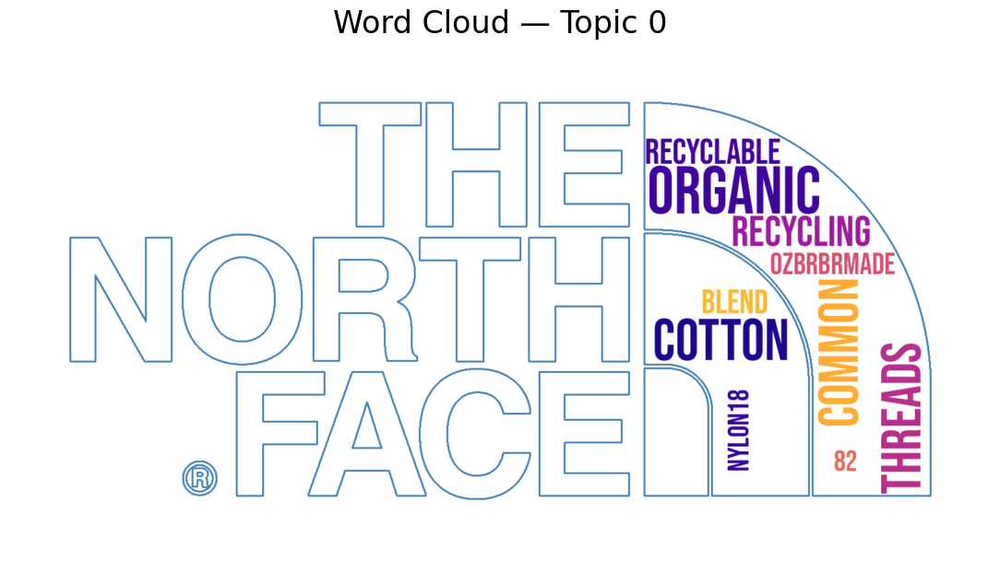

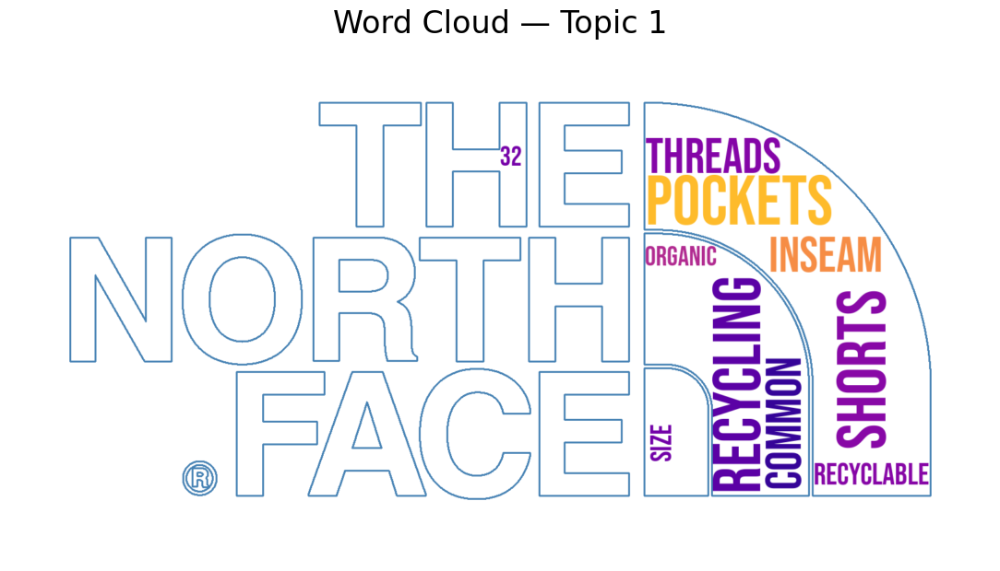

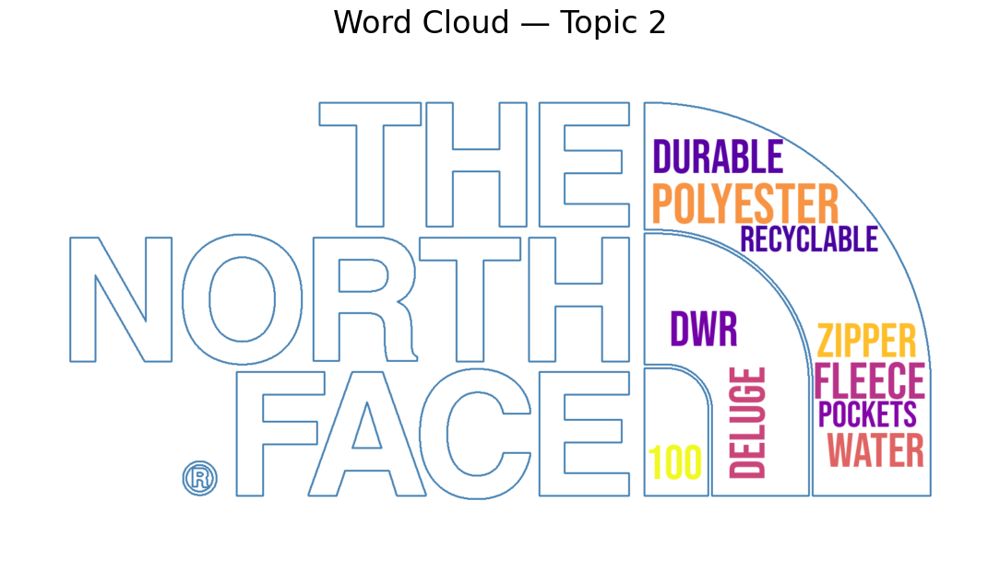

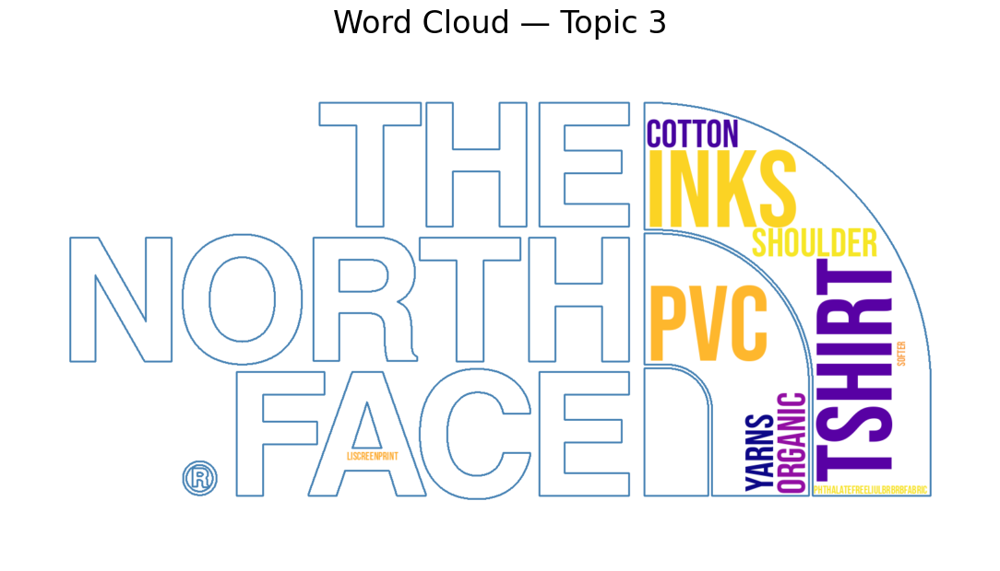

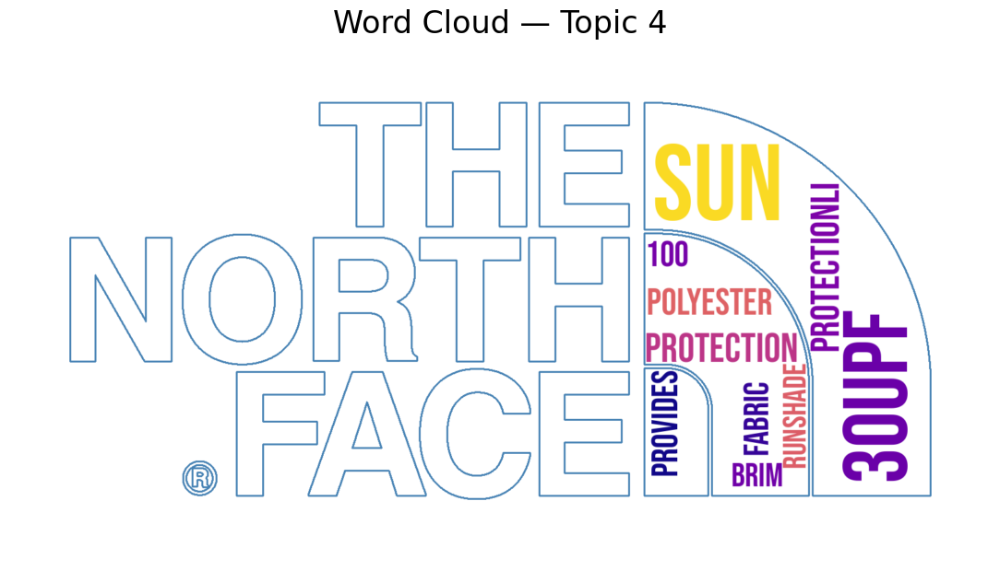

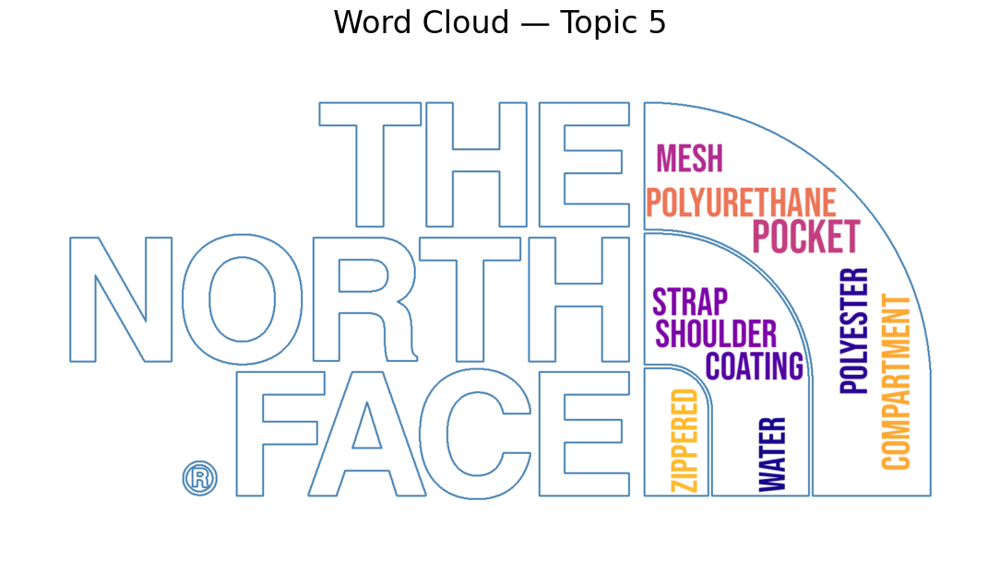

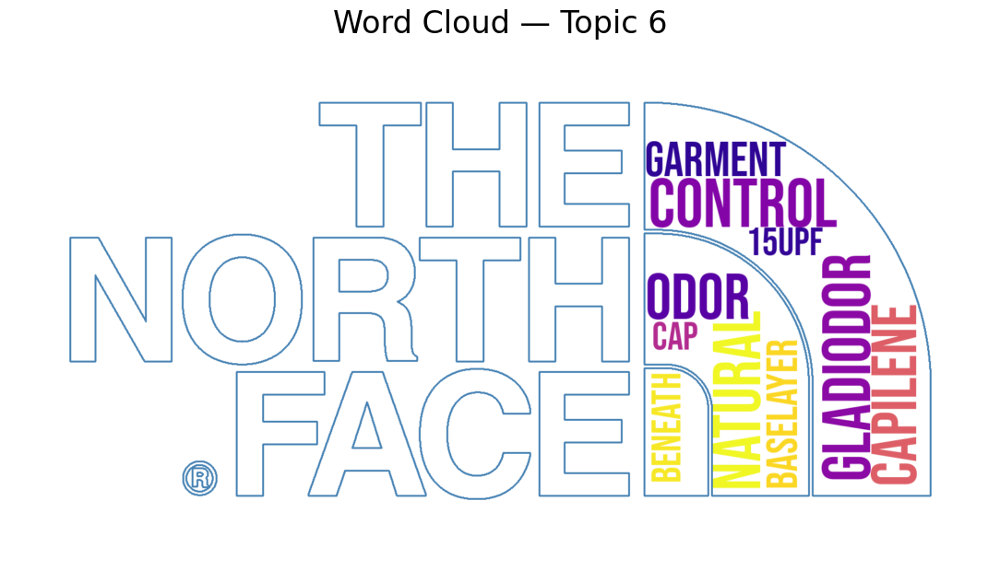

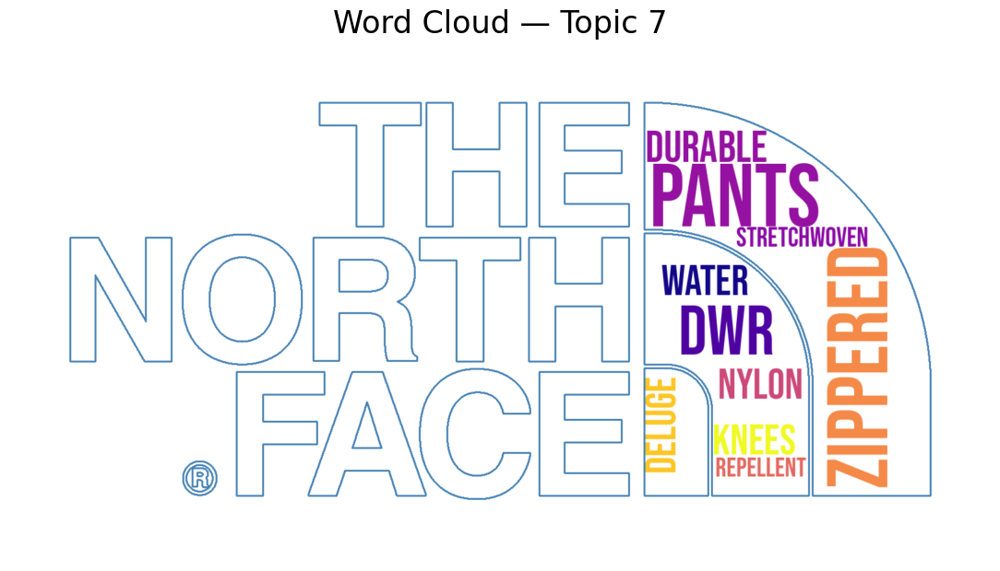

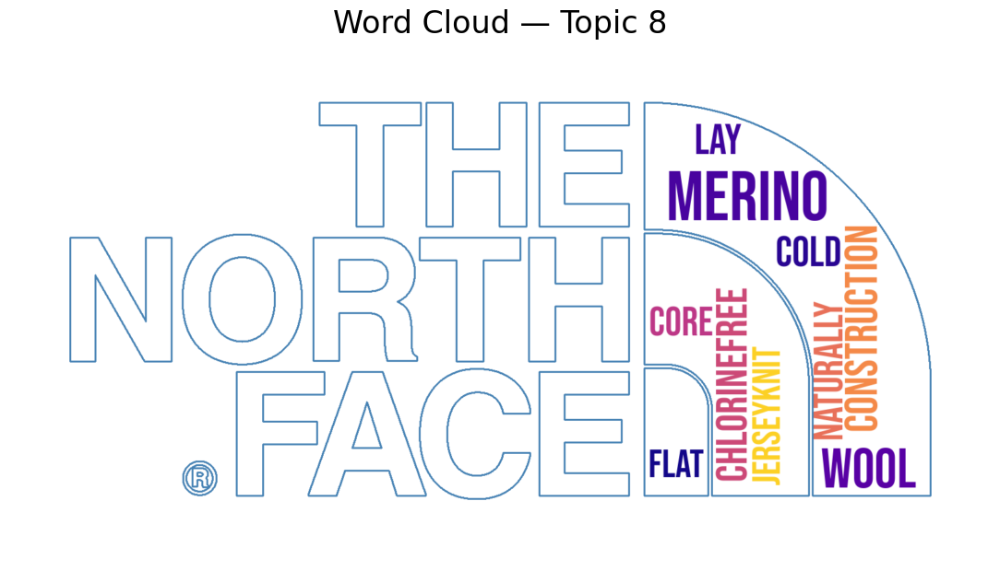

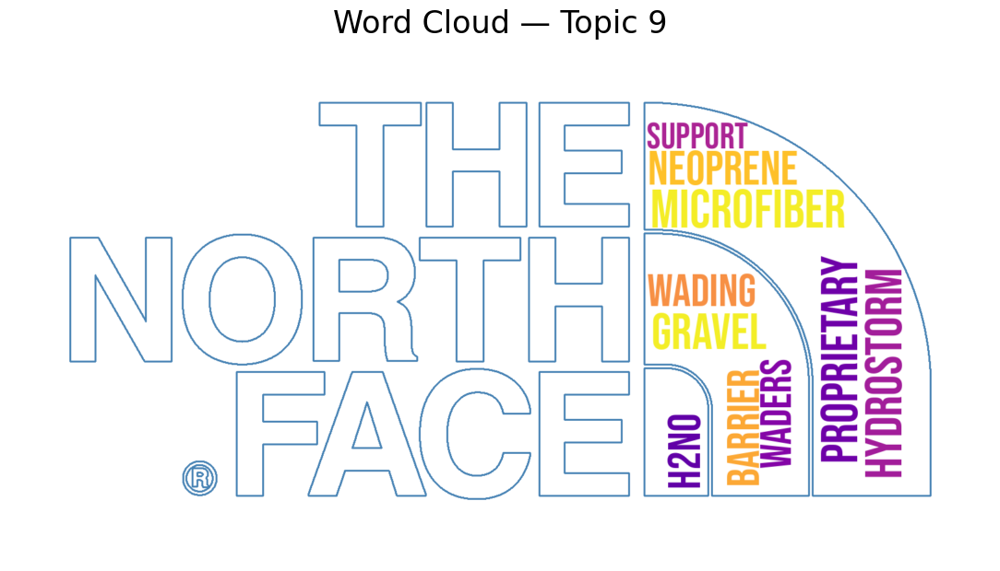

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import numpy as np
from PIL import Image

# ==== Load & prepare the North Face logo as a mask ====
logo_image = Image.open("northfacelogo.png").convert("RGBA")

# Make fully transparent pixels white so the mask works well
rgba = np.array(logo_image)
rgba[rgba[:, :, 3] == 0] = [255, 255, 255, 255]
logo_gray = Image.fromarray(rgba).convert("L")

mask = np.array(logo_gray)

# ==== Custom font ====
font_path = "BebasNeue-Regular.ttf"

# ==== WordCloud styling ====
wc = WordCloud(
    width=600,
    height=300,
    background_color="white",
    max_words=200,
    mask=mask,
    contour_color="steelblue",
    contour_width=2,
    colormap="plasma",
    font_path=font_path,
    random_state=42,
    collocations=False,
    prefer_horizontal=0.9,
    normalize_plurals=True,
    # optional global size controls if you want smaller words:
    # max_font_size=60, relative_scaling=0.4
)

# ==== Get topics from BERTopic ====
# topic_model.get_topics() returns: {topic_id: [(word, weight), ...], ...}
topic_info = topic_model.get_topics()

# ==== Generate one cloud per topic (skip -1 = outliers) ====
TOP_K = 50  # top-N words per topic

for topic_num, word_freqs in topic_info.items():
    if topic_num == -1 or not word_freqs:
        continue

    # Convert list of (word, weight) to dict for WordCloud
    word_freq_dict = dict(word_freqs[:TOP_K])

    # Skip if effectively empty after slicing
    if not word_freq_dict:
        continue

    cloud = wc.generate_from_frequencies(word_freq_dict)

    plt.figure(figsize=(12, 6))
    plt.imshow(cloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud — Topic {topic_num}", fontsize=24)
    plt.tight_layout(pad=0)
    plt.show()

    # Optional: save each image
    # cloud.to_file(f"wordcloud_topic_{topic_num}.png")


In [ ]:
fig = topic_model.visualize_barchart(top_n_topics=10, n_words=10)

# Change figure size
fig.update_layout(
    height=1000,
    width=1500
)

fig.show()


**Key insights:**

- Using BERTopic, we extracted recurring themes in the product descriptions.

- The topics reveal how items are marketed, ranging from sustainable fabrics to technical performance features and functional design details.

- Together, they highlight the brand’s dual focus on eco-friendly materials and high-performance outdoor gear.

- **Topic interpretations:**

Topic 0 – Sustainable Materials → organic cotton, recycled fibers, threads (eco-friendly fabrics).

Topic 1 – Fit & Design Features → pockets, shorts, inseam, size (garment construction and usability).

Topic 2 – Technical Performance Fabrics → polyester, fleece, DWR, deluge (durability, water resistance).

Topic 3 – Printing & Basic Apparel → PVC inks, t-shirts, yarns, cotton (printed basics and materials).

Topic 4 – Sun Protection Gear → UPF ratings, sun protection, brim (UV-protective clothing).

Topic 5 – Gear & Accessories → polyurethane, mesh, straps, compartments (backpacks, equipment).

Topic 6 – Baselayers & Odor Control → Capilene, odor, baselayer (technical underlayers).

Topic 7 – Technical Pants → zippered, stretchwoven, reinforced knees (outdoor/hiking pants).

Topic 8 – Merino & Natural Fibers → merino wool, natural construction (premium breathable fabrics).

Topic 9 – Advanced Waterproofing → H2No, neoprene, microfiber (proprietary waterproofing tech).